In [6]:
# pip install opencv-python

In [227]:
# pip install pydot

In [239]:
# pip install graphviz

In [ ]:
#Import Libraries
import pandas as pd
import numpy as np
import keras
import tensorflow as tf
import keras.losses
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras import layers
from keras.models import Sequential
from keras.utils import plot_model
from keras.utils import model_to_dot
import pydot
from IPython.display import SVG
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout , BatchNormalization, GroupNormalization, Activation, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix,ConfusionMatrixDisplay
import os
from keras.callbacks import ReduceLROnPlateau
import cv2
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay
# import imghdr
import joblib
import PIL
from PIL import Image
from sklearn.metrics import roc_curve, auc

In [231]:
os.replace('./test_move.jpg', './token_images/test_move.jpg')

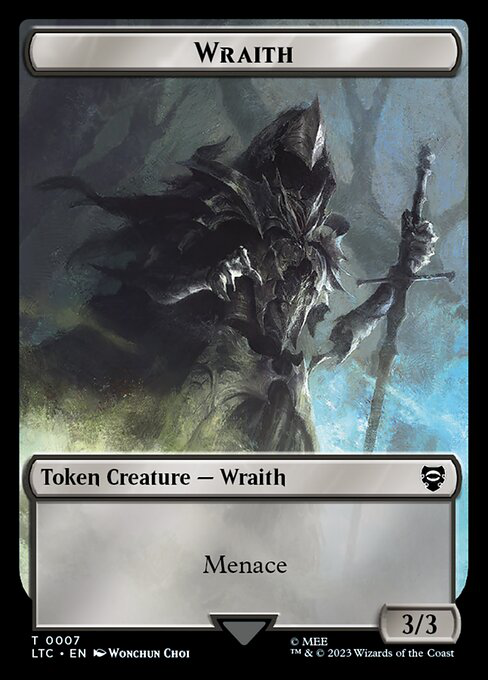

In [19]:
img = Image.open('./token_images/image_666_token.jpg')
img

In [20]:
# comparing shapes of token and play card images 
np.shape(cv2.imread(img))

TypeError: Can't convert object to 'str' for 'filename'

In [211]:
# comparing shapes of token and play card images 
img = cv2.imread('./token_images/image_542_token.jpg')

In [219]:
img_resize= cv2.resize(img, (488, 488))

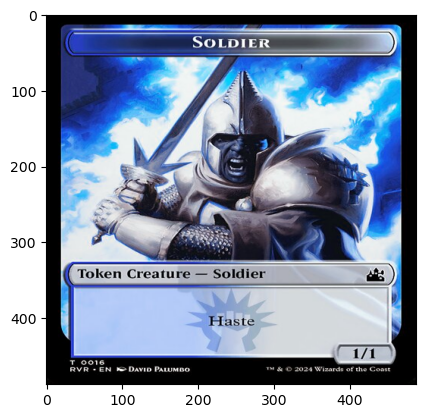

In [220]:
plt.imshow(img_resize)

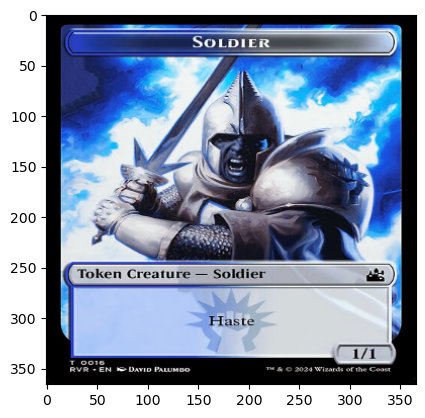

In [218]:
plt.imshow(img_resize)

In [2]:
# #Function to load the dataset

# labels = ['play_card', 'token']
# def get_training_data(data_dir):
#     data = [] 
#     for label in labels: 
#         path = os.path.join(data_dir, label)
#         class_num = labels.index(label)
#         for img in os.listdir(path):
#             try:
#                 img_arr = cv2.imread(os.path.join(path, img))
#                 data.append([img_arr, class_num])
#             except Exception as e:
#                 print(e)
#     return data

In [26]:
labels = ['play_card', 'token']
img_size = 366
def get_training_data(data_dir):
    data = [] 
    for label in labels: 
        path = os.path.join(data_dir, label)
        class_num = labels.index(label)
        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img))
                resized_arr = cv2.resize(img_arr, (img_size, img_size))
                data.append([resized_arr, class_num])
            except Exception as e:
                print(e)
    return data

In [27]:
# #Creating Data_dir and calling the function "get_training_data"

train = get_training_data('./train')
test = get_training_data('./test')

# x_train = []
# y_train = []

# x_test = []
# y_test = []

0

In [12]:
train[0][1]

0

In [28]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("vertical"),
  layers.RandomRotation(0.015),
    layers.RandomContrast([.15,.2]),
    layers.RandomZoom(.025),
    layers.RandomBrightness([.01,.45])
])

data_augmentation2 = tf.keras.Sequential([
    layers.RandomContrast([.175,.35]),
    layers.RandomBrightness([.09,.45]),
    layers.RandomTranslation(.01,.1)
])


x_train = []
y_train = []

x_val = []
y_val = []

x_test = []
y_test = []

In [29]:
for feature, label in train[1500:1600]:
    if label == 1:
        augmented_image = data_augmentation(feature)
        x_train.append(augmented_image)
        x_val.append(augmented_image)
        y_train.append(label)
        y_val.append(label)
        
        x_train.append(feature) 
        x_val.append(feature)
        y_train.append(label)
        y_val.append(label)

In [30]:
for feature, label in train:
    if label == 0:
        augmented_image = data_augmentation2(feature)
        x_train.append(augmented_image)
        x_val.append(augmented_image)
        y_train.append(label)
        y_val.append(label)
        
        x_train.append(feature) 
        x_val.append(feature)
        y_train.append(label)
        y_val.append(label)

In [31]:
for feature, label in test:
    x_test.append(feature)
    y_test.append(label)

In [32]:
x_train = np.array(x_train) / 255
x_test = np.array(x_test) / 255
x_val = np.array(x_val) / 255

In [33]:
print("x_train shape:", x_train.shape)
print("x_val shape:",x_val.shape)
print("x_test shape:", x_test.shape)
print()
print("y_train length:", len(y_train))
print("y_train count 0 ",y_train.count(0))
print("y_train count 1 ",y_train.count(1))
print("y_val length:",len(y_val))
print("y_val count 0 ",y_val.count(0))
print("y_val count 1 ",y_val.count(1))
print("y_test length:",len(y_test))
print("y_test count 0 ",y_test.count(0))
print("y_test count 1 ",y_test.count(1))

x_train shape: (2506, 366, 366, 3)
x_val shape: (2506, 366, 366, 3)
x_test shape: (1222, 366, 366, 3)

y_train length: 2506
y_train count 0  2306
y_train count 1  200
y_val length: 2506
y_val count 0  2306
y_val count 1  200
y_test length: 1222
y_test count 0  978
y_test count 1  244


In [13]:
y_train.count(1)

1362

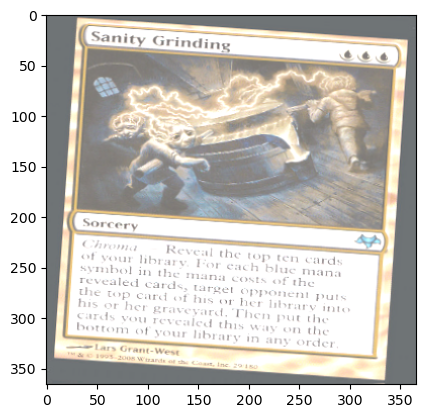

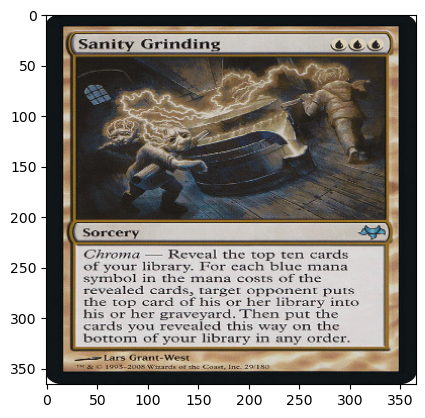

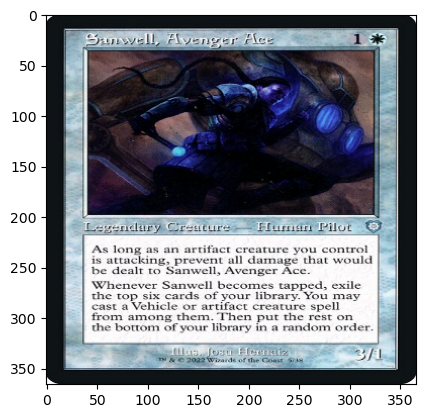

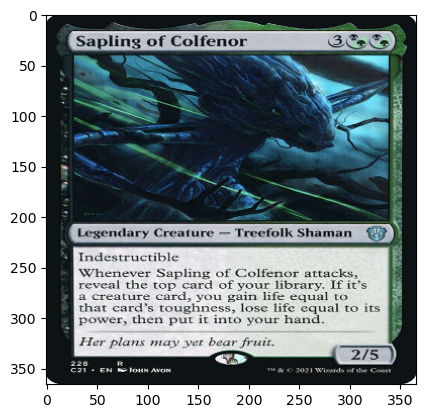

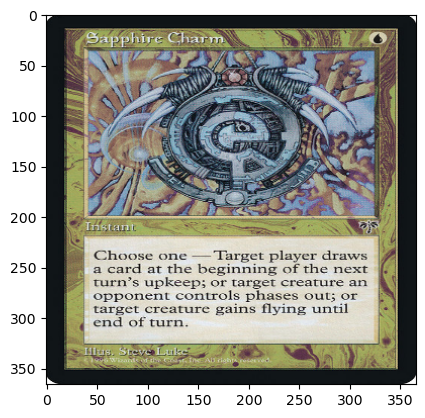

...

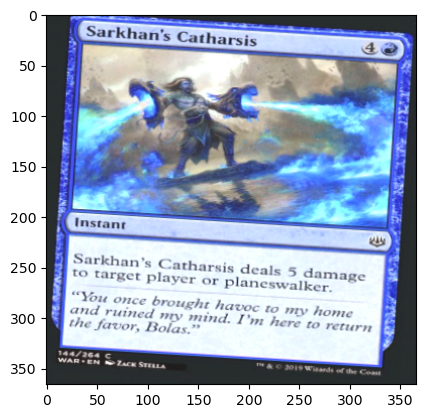

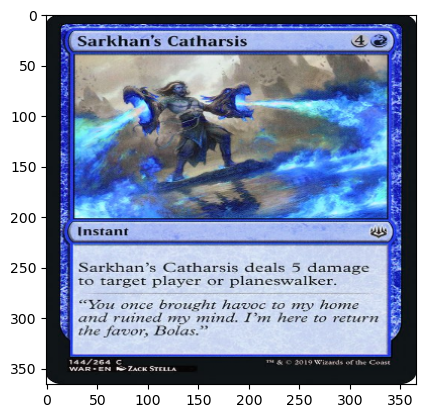

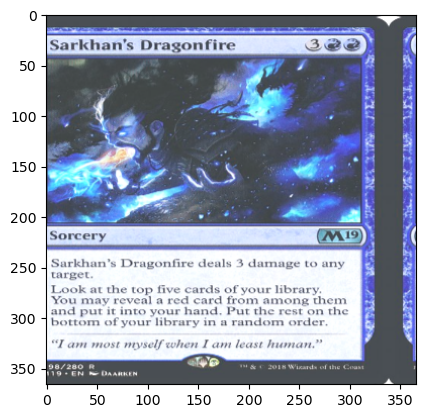

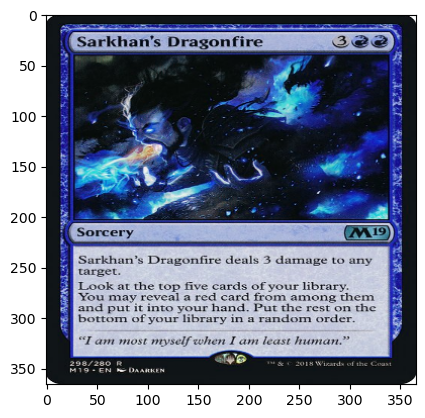

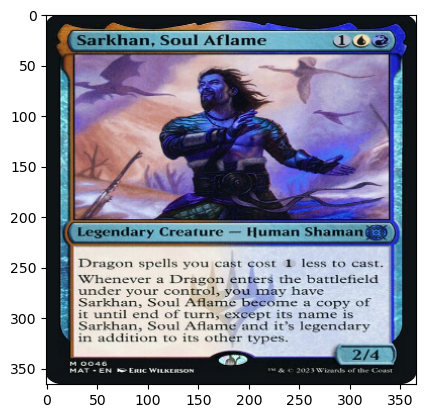

In [15]:
for i in range(len(x_train[:50])):
    plt.imshow((x_train[i]))
    plt.show()

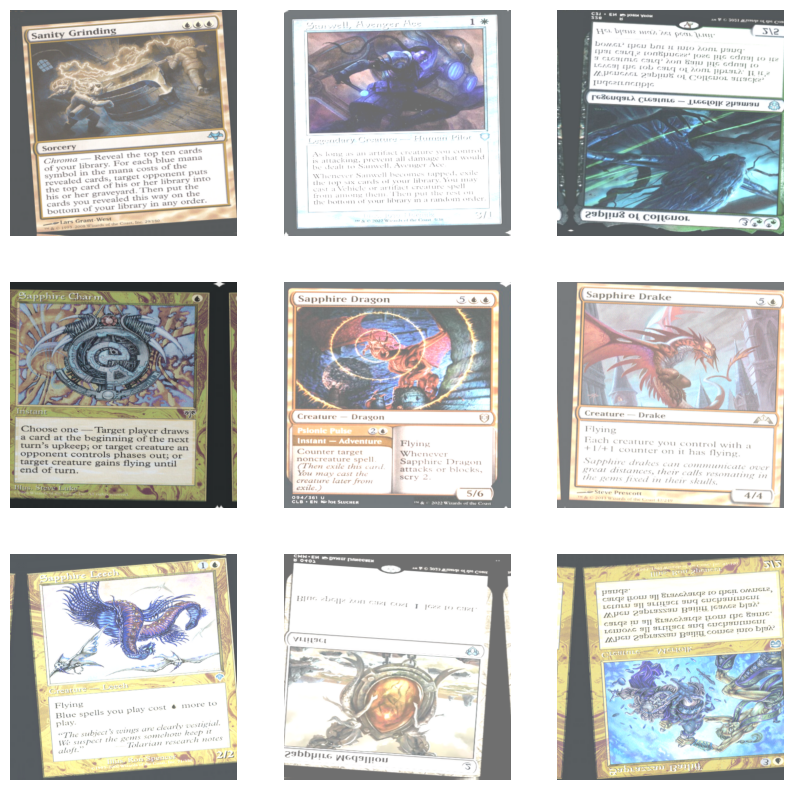

In [230]:
plt.figure(figsize=(10, 10))
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("vertical"),
  layers.RandomRotation(0.015),
    layers.RandomContrast([.15,.2]),
    layers.RandomZoom(.025),
    layers.RandomBrightness([.01,.45]),
    layers.RandomTranslation(.01,.1),
])
for i in range(9):
    augmented_image = np.array(data_augmentation(train[i][0]))
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_image.astype('uint8'))
    plt.axis("off")

In [22]:
#Setting up the callback function
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose=1,factor=0.3, min_lr=0.000001)

In [16]:
# #Building the model - unsized_model -
    
# #First block: input and convolutional layer
# model = Sequential()
# model.add(Conv2D(32 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu' , input_shape = (680, 488, 3)))
# model.add(BatchNormalization())
# model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

# #Second block:
# model.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
# model.add(Dropout(0.2))
# model.add(BatchNormalization())
# model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
# model.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
# model.add(BatchNormalization())
# model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

# #Third block
# model.add(Conv2D(128 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
# model.add(Dropout(0.1))
# model.add(BatchNormalization())
# model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

# #Fourth block
# model.add(Conv2D(256 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
# model.add(Dropout(0.2))
# model.add(BatchNormalization())
# model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

# #Flatten layer:
# model.add(Flatten())

# #Dense layer:
# model.add(Dense(units = 128 , activation = 'relu'))
# model.add(Dropout(0.2))
# model.add(Dense(units = 64 , activation = 'relu'))
# model.add(Dropout(0.2))

# #Output layer
# model.add(Dense(units = 1 , activation = 'sigmoid'))
# model.compile(optimizer = "rmsprop" , loss = 'binary_crossentropy' , metrics = ['accuracy'])

In [34]:
#Building the model - resized_model
    
#First block: input and convolutional layer
model = Sequential()
model.add(Conv2D(32 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu' , input_shape = (366, 366, 3)))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

#Second block:
model.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
# model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
model.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

#Third block
model.add(Conv2D(128 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
model.add(Dropout(0.1))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

#Fourth block
model.add(Conv2D(256 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

#Flatten layer:
model.add(Flatten())

#Dense layer:
model.add(Dense(units = 128 , activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(units = 64 , activation = 'relu'))
model.add(Dropout(0.2))

#Output layer
model.add(Dense(units = 1 , activation = 'sigmoid'))
model.compile(optimizer = "rmsprop" , loss = 'binary_crossentropy' , metrics = ['accuracy'])

In [35]:
#Training the model-setting uo the epoch, batch_size and callbacks
x_train_np = np.array(x_train)
y_train_np= np.array(y_train)
x_val_np = np.array(x_val)
y_val_np = np.array(y_val)


model.fit(x_train_np,y_train_np ,epochs = 10, batch_size=50,
                    validation_data = (x_val_np, y_val_np),callbacks = [learning_rate_reduction])

Epoch 1/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 687s 9s/step - accuracy: 0.8958 - loss: 1.7197 - val_accuracy: 0.2179 - val_loss: 1.3261 - learning_rate: 0.0010
Epoch 2/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 289s 6s/step - accuracy: 0.9806 - loss: 0.2668 - val_accuracy: 0.9202 - val_loss: 1.1917 - learning_rate: 0.0010
Epoch 3/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 277s 5s/step - accuracy: 0.9902 - loss: 0.1274 - val_accuracy: 0.0798 - val_loss: 22.9024 - learning_rate: 0.0010
Epoch 4/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 279s 5s/step - accuracy: 0.9908 - loss: 0.1868 - val_accuracy: 0.8811 - val_loss: 0.2963 - learning_rate: 0.0010
Epoch 5/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 298s 6s/step - accuracy: 0.9980 - loss: 0.0161 - val_accuracy: 0.1852 - val_loss: 12.0110 - learning_rate: 0.0010
Epoch 6/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9955 - loss: 0.0518
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
51/51 ━━━━━━━━━━━━━━━━━━━━ 299s 6s/step - accuracy: 0.9955 - loss: 0.0523 - val_accu

In [36]:
prediction = model.predict(x_test)

39/39 ━━━━━━━━━━━━━━━━━━━━ 20s 511ms/step


In [37]:
predictions = (prediction > 0.5)*1 # convert probabilities to binary output
predictions

array([[0],
       [0],
       [0],
       ...,
       [1],
       [1],
       [1]])

In [38]:
accuracy_score(y_test, predictions)

0.9877250409165302

In [39]:
model.save('./image_classification_imbalancedmodel.keras')

In [2]:
# #unsized model - original size, only 10 epochs
# unsized_model=keras.models.load_model('image_classification1.keras')

In [126]:
# #resized model - images were resized to 488x488 and increased epochs to 300 
# resized_model=keras.models.load_model('image_classification2.keras')

In [ ]:
# #final model - images resized to 366x366 and increased epochs to 100
# final_model = kera.models.load_model('image_classification_finalmodel.keras')

In [26]:
cm = confusion_matrix(y_test, predictions)

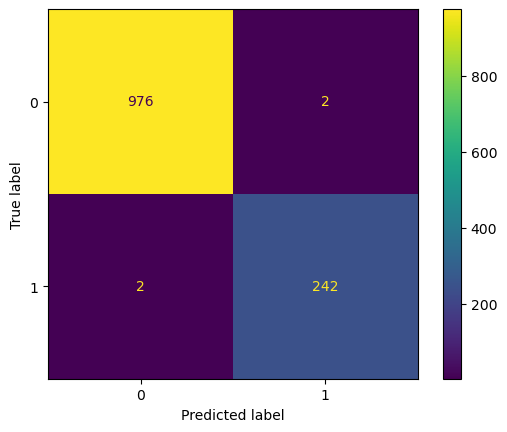

In [27]:
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1]).plot()
plt.show()

In [28]:
fpr, tpr, thresholds = roc_curve(y_test,predictions)

In [199]:
# predictions = list(map(lambda x: x[0], predictions))

In [29]:
roc_auc = auc(fpr, tpr)

In [30]:
print(roc_auc)
print(fpr)
print(tpr)

0.9948791444567369
[0.         0.00204499 1.        ]
[0.         0.99180328 1.        ]


In [31]:
keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=False,
    show_dtype=False,
    show_layer_names=False,
    rankdir="TB",
    expand_nested=False,
    dpi=200,
    show_layer_activations=False,
    show_trainable=False)

AttributeError: module 'pydot' has no attribute 'InvocationException'

In [32]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 366, 366, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 366, 366, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 183, 183, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 183, 183, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 183, 183, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 92, 92, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 92, 92, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 92, 92, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 46, 46, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 46, 46, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 46, 46, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 46, 46, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 23, 23, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 23, 23, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 23, 23, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 23, 23, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36864)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,718,720 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 10,308,036 (39.32 MB)

 Trainable params: 5,153,473 (19.66 MB)

 Non-trainable params: 1,088 (4.25 KB)

 Optimizer params: 5,153,475 (19.66 MB)

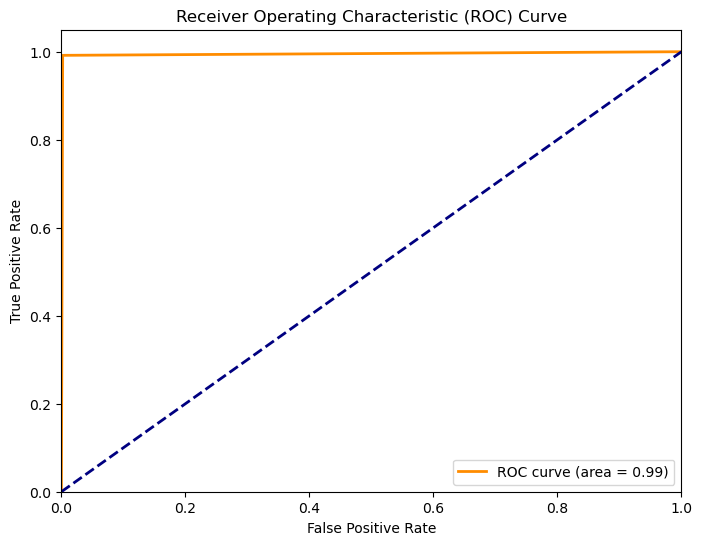

In [33]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [34]:
print(classification_report(y_test, predictions, target_names = ['Play Card (Class 0)','Token Card (Class 1)']))

                      precision    recall  f1-score   support

 Play Card (Class 0)       1.00      1.00      1.00       978
Token Card (Class 1)       0.99      0.99      0.99       244

            accuracy                           1.00      1222
           macro avg       0.99      0.99      0.99      1222
        weighted avg       1.00      1.00      1.00      1222



In [35]:
#Separate of the correct and incorrect predictions
correct = np.nonzero(predictions == y_test)[0]
incorrect = np.nonzero(predictions != y_test)[0]

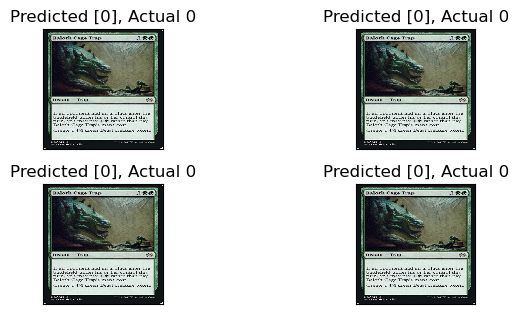

In [38]:
#Visualizing some correct predictions
i = 0
for c in correct[:4]:
    plt.subplot(3,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(x_test[c], interpolation='none')
    plt.title("Predicted {}, Actual {}".format(predictions[c], y_test[1]))
    plt.tight_layout()
    i += 1

In [222]:
plot_model(model, to_file='model.png')
SVG(model_to_dot(model).create(prog='dot', format='svg'))

AttributeError: module 'pydot' has no attribute 'InvocationException'

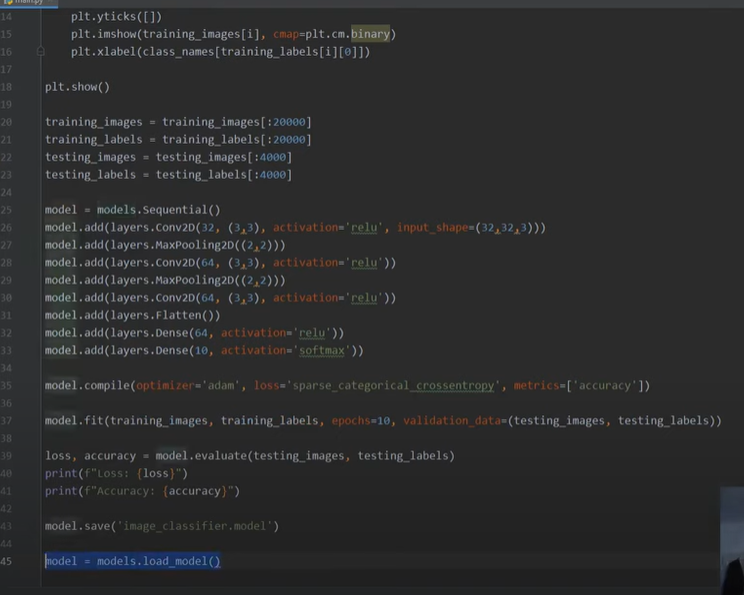

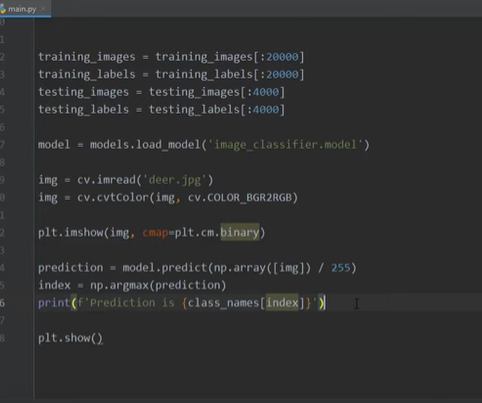

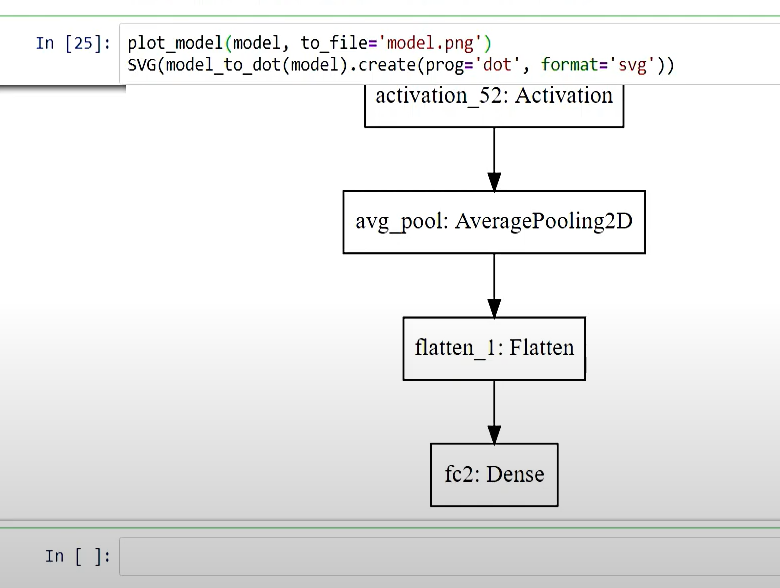